In [1]:
%reload_ext autoreload
%autoreload 2

In [9]:
import os
import shutil
import numpy as np
import librosa
from pathlib import Path
from avhubert.utils import load_video
from avhubert.audio_hubert import AVHubertModel
from avhubert.sparc import load_model
from fairseq.checkpoint_utils import load_model_ensemble_and_task
from python_speech_features import logfbank
from pesq import pesq
from speechmos import dnsmos
import torch
import torchaudio
import soundfile as sf
import IPython.display as ipd
import random
from scipy.signal import resample, windows
from torchmetrics.functional.audio.dnsmos import deep_noise_suppression_mean_opinion_score
from tqdm import tqdm
from avhubert.sparc import load_model
from train_avatar import EMAReconstructionModel
import matplotlib.pyplot as plt
import warnings
from transformers import AutoModelForSpeechSeq2Seq, AutoProcessor, pipeline, AutoProcessor
import jiwer

warnings.filterwarnings("ignore")


In [10]:
class AvatarInferenceDataPreprocessor():
    def __init__(self, avhubert_path=None, random_seed=42):        
        self.random_seed = random_seed
        random.seed(self.random_seed)

        self.embedding_extractor, self.sparc_encoder = self._default_embedding_extractor(avhubert_path)
        self.stack_order_audio = 4  # Used for audio feature stacking
    
    def _get_ema_embedding(self, audio: np.array):
        """
        Process audio array to extract EMA embedding along with loudness and pitch

        Args:
        - audio_arr (np.array): Input audio array.

        Returns:
        - np.ndarray: Concatenated EMA, loudness, and pitch values.
        """
        encoding = self.sparc_encoder.encode(audio)

        # Process encodings
        loudness = resample(encoding['loudness'], encoding['loudness'].shape[0] * 2)
        pitch = resample(encoding['pitch'], encoding['pitch'].shape[0] * 2)

        # Adjust length to match shortest
        shortest_len = min(loudness.shape[0], pitch.shape[0], encoding['ema'].shape[0])
        loudness = loudness[:shortest_len]
        pitch = pitch[:shortest_len]
        ema_values = encoding['ema'][:shortest_len]
        ema = np.concatenate(
            [
                ema_values,       # [L, 12]
                loudness,         # [L, 1]
                pitch             # [L, 1]
            ],
            axis=-1)

        return ema
    
    def _default_embedding_extractor(self, avhubert_path):
        if not avhubert_path:
            raise ValueError("Provide the path to an AVHubert checkpoint")
        av_hubert_models, _, _ = load_model_ensemble_and_task([avhubert_path])
        model = av_hubert_models[0]
        model.eval()
        self.model = model
        sparc_encoder = load_model("multi", device="cpu", use_penn=True)
        
        def extract_embeddings(video_frames: torch.Tensor, noisy_audio_feat: torch.Tensor):
            """
            Extract AV-HuBERT embeddings, and concatenate EMA, loudness, and pitch values from the sparc_encoder.
            
            Args:
            - video_frames (torch.Tensor): Video frames tensor.
            - noisy_audio_feat (torch.Tensor): Audio features tensor.
            
            Returns:
            - av_embeddings (np.ndarray): AV-HuBERT embeddings.
            """
            with torch.no_grad():
                video_frames = video_frames.unsqueeze(0).unsqueeze(0)  # [1, 1, T, H, W]
                noisy_audio_feat = noisy_audio_feat.unsqueeze(0).permute(0, 2, 1)  # [1, F, T]
                
                outputs = self.model(source={'video': video_frames, 'audio': noisy_audio_feat}, features_only=True)
                av_embeddings = outputs["features"].squeeze().numpy()  # [T, D]

            return av_embeddings
        return extract_embeddings, sparc_encoder

    def _augment_with_noise(self, speech, noise, snr):
        clean_len = speech.shape[-1]
        noise_len = noise.shape[-1]

        # Select a random segment of the noise if noise is longer than the speech
        if clean_len < noise_len:
            start_idx = random.randint(0, noise_len - clean_len - 1)
            noise = noise[:, start_idx:start_idx + clean_len]
        # Loop noise if noise is shorter than speech
        elif clean_len > noise_len:
            n_loops = clean_len // noise_len + 1
            # Apply Tukey window to avoid popping
            tukey = torch.from_numpy(np.expand_dims(windows.tukey(noise_len), 0))
            noise = noise * tukey
            noise = noise.tile((1, n_loops))[:, :clean_len]

        # Randomly select an SNR level and add noise to the speech
        noisy_speech = torchaudio.functional.add_noise(speech, noise, torch.Tensor([snr]))
        return noisy_speech
    
    def _get_avatar_embedding(self, avhubert_embedding, noisy_ema_data, clean_ema_data):
        # Resample EMA data which has twice the number of frames as AVHubert
        noisy_ema_data = resample(noisy_ema_data, avhubert_embedding.shape[0])
        clean_ema_data = resample(clean_ema_data, avhubert_embedding.shape[0])

        # Scale pitch of ema data (last col)
        scale_down_factor = 100
        noisy_ema_data[:, -1] = noisy_ema_data[:, -1] / scale_down_factor
        clean_ema_data[:, -1] = clean_ema_data[:, -1] / scale_down_factor

        # Concatenate
        avatar_embedding = np.concatenate([avhubert_embedding, noisy_ema_data], axis=-1)

        return avatar_embedding, noisy_ema_data, clean_ema_data

    
    def preprocess_data(self, video_file, noise_file, snr):
        SAMPLE_RATE = 16000

        def stack_features(feats):
            feat_dim = feats.shape[1]
            if len(feats) % self.stack_order_audio != 0:
                res = self.stack_order_audio - len(feats) % self.stack_order_audio
                feats = np.concatenate([feats, np.zeros([res, feat_dim], dtype=feats.dtype)], axis=0)
            return feats.reshape((-1, self.stack_order_audio * feat_dim))

        video_frames = torch.from_numpy(load_video(video_file).astype(np.float32))
        clean_wav, _ = librosa.load(video_file, sr=SAMPLE_RATE)
        clean_wav = torch.from_numpy(np.expand_dims(clean_wav, 0))
        noise_wav, sr = torchaudio.load(noise_file)
        if sr != SAMPLE_RATE:
            resampler = torchaudio.transforms.Resample(orig_freq=sr, new_freq=SAMPLE_RATE)
            noise_wav = resampler(noise_wav)
        noisy_wav = self._augment_with_noise(clean_wav, noise_wav, snr)

        noisy_audio_feats = logfbank(noisy_wav.numpy(), samplerate=SAMPLE_RATE).astype(np.float32)
        noisy_audio_feats = stack_features(noisy_audio_feats)
        noisy_audio_feats = torch.from_numpy(noisy_audio_feats)

        # Padding for audio features (from load_feature in hubert_dataset.py)
        diff = len(noisy_audio_feats) - len(video_frames)
        if diff < 0:
            noisy_audio_feats = np.concatenate([noisy_audio_feats, np.zeros([-diff, noisy_audio_feats.shape[-1]], dtype=noisy_audio_feats.dtype)])
        elif diff > 0:
            noisy_audio_feats = noisy_audio_feats[:-diff]

        # Process EMA values
        noisy_ema = self._get_ema_embedding(noisy_wav.numpy().flatten())
        clean_ema = self._get_ema_embedding(clean_wav.numpy().flatten())

        # Process AV-HuBERT embedding
        avhubert_embedding = self.embedding_extractor(video_frames, noisy_audio_feats)

        # Process Avatar embedding
        avatar_embedding, noisy_ema_data, clean_ema_data = self._get_avatar_embedding(avhubert_embedding, noisy_ema, clean_ema)

        return avatar_embedding, noisy_wav.numpy().flatten(), clean_wav.numpy().flatten(), noisy_ema_data, clean_ema_data

In [11]:
import matplotlib

def plot_art(ax, art, art_noisy, art_avatar, gap=5, skip_y=False,color=None,alpha=1.0, lw=2, title=''):
    yticks=[]
    ytick_labels=[]
    labels = ["UL","LL", "LI", "TT", "TB", "TD"]
    chidxs = []
    HPRC_channel_label = ['LIX','LIY','ULX','ULY','LLX','LLY','TTX','TTY','TBX','TBY','TDX','TDY','Loudness','Pitch']
    channel_label = HPRC_channel_label
    for l in labels:
        chidxs.append(HPRC_channel_label.index(l+"X"))
        chidxs.append(HPRC_channel_label.index(l+"Y"))
    chidxs.append(HPRC_channel_label.index("Loudness"))
    chidxs.append(HPRC_channel_label.index("Pitch"))

    clean_color = 'tab:blue'
    noisy_color = 'tab:red'
    avatar_color = 'tab:orange'

    for i, ch_i in enumerate(chidxs):
        ch_label = channel_label[ch_i]
        ytick_labels.append(ch_label)
        if ch_label == "Loudness" or ch_label == "Pitch":
            scale_factor = 100 if ch_label == "Pitch" else 1
            # scale_factor = 1
            ax.plot(art[ch_label.lower()]/scale_factor-gap*i,color=clean_color,alpha=alpha,lw=lw)
            ax.plot(art_noisy[ch_label.lower()]/scale_factor-gap*i,color=noisy_color,alpha=alpha,lw=lw)
            ax.plot(art_avatar[:,ch_i]-gap*i,color=avatar_color,alpha=alpha,lw=lw)
        else:
            ax.plot(art['ema'][:,ch_i]-gap*i,color=clean_color,alpha=alpha,lw=lw)
            ax.plot(art_noisy['ema'][:,ch_i]-gap*i,color=noisy_color,alpha=alpha,lw=lw)
            ax.plot(art_avatar[:,ch_i]-gap*i,color=avatar_color,alpha=alpha,lw=lw)
        yticks.append(-gap*i)
    if skip_y:
        ytick_labels = [""]*len(ytick_labels)

    ax.set_yticks(yticks,ytick_labels,fontsize=15)

    xticks= np.arange(0,len(art['ema']),50)
    xtick_labels= [f"{int(x*20/1000)}" for x in xticks]
    ax.set_xticks(xticks, xtick_labels,fontsize=15)
    ax.set_xlabel("Time (s)", fontsize=15)
    ax.set_xlim(0,len(art['ema']))
    ax.set_title(title)

    # Manually create legend
    ax.legend(handles=[matplotlib.lines.Line2D([0], [0], label='Clean SPARC', color=clean_color),
                       matplotlib.lines.Line2D([0], [0], label='Noisy SPARC', color=noisy_color), 
                       matplotlib.lines.Line2D([0], [0], label='AVATAR', color=avatar_color)])
    return yticks

In [12]:
class AvatarInferencePipeline:
    def __init__(self, avatar_model_path, avhubert_model_path):
        self.device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

        # Load Avatar Preprocessor
        self.avatar_preprocessor = AvatarInferenceDataPreprocessor(avhubert_model_path)

        # Load EMA Reconstruction Model
        self.avatar = EMAReconstructionModel()
        self.avatar.load_state_dict(torch.load(avatar_model_path, map_location=self.device))
        self.avatar.eval().to(self.device)

        # Load SPARC Decoder
        self.sparc_model = load_model("multi", device=self.device, use_penn=False)

        # Load Whisper Model
        self.torch_dtype = torch.float16 if torch.cuda.is_available() else torch.float32
        self.asr_model_id = "openai/whisper-large-v3"
        self.asr_model = AutoModelForSpeechSeq2Seq.from_pretrained(
            self.asr_model_id, torch_dtype=self.torch_dtype, low_cpu_mem_usage=True, use_safetensors=True
        )
        self.asr_model.to(self.device)

        self.asr_processor = AutoProcessor.from_pretrained(self.asr_model_id)

        self.asr = pipeline(
            "automatic-speech-recognition",
            model=self.asr_model,
            tokenizer=self.asr_processor.tokenizer,
            feature_extractor=self.asr_processor.feature_extractor,
            torch_dtype=self.torch_dtype,
            device=self.device,
        )

    def _get_sparc_resynthesis(self, audio):
        code = self.sparc_model.encode(audio)
        resynth = self.sparc_model.decode(**code)

        return resynth
    
    def get_asr_transcript_and_wer(self, audio, gt_transcript):
        wer_preprocess = jiwer.Compose(
            [
                jiwer.ToLowerCase(),
                jiwer.RemoveWhiteSpace(replace_by_space=True),
                jiwer.RemoveMultipleSpaces(),
                jiwer.RemovePunctuation(),
                jiwer.Strip(),
                jiwer.ReduceToListOfListOfWords(),
            ])
        asr_transcript = self.asr(audio, generate_kwargs={"language": "english"})['text']
        wer_score = jiwer.wer(gt_transcript, asr_transcript, reference_transform=wer_preprocess, hypothesis_transform=wer_preprocess)
        return asr_transcript, wer_score

    def run(self, video_file, noise_file, snr):
        # Step 1: Extract Avatar embedding and noisy and clean audio
        avatar_embedding, noisy_wav, clean_wav, noisy_ema_data, clean_ema_data = self.avatar_preprocessor.preprocess_data(video_file, noise_file, snr)
        
        # Step 2: Run through inference AVATAR
        with torch.no_grad():
            ema_predictions = self.avatar(torch.from_numpy(avatar_embedding)).squeeze().cpu().numpy()

        # Get MSE and L1 for EMA data
        mse_noisy = torch.nn.functional.mse_loss(torch.from_numpy(noisy_ema_data[:, :12]), torch.from_numpy(clean_ema_data[:, :12])).item()
        mse_avatar = torch.nn.functional.mse_loss(torch.from_numpy(ema_predictions[:, :12]), torch.from_numpy(clean_ema_data[:, :12])).item()
        print("MSE Loss (Noisy SPARC):", mse_noisy)
        print("MSE Loss (AVATAR):", mse_avatar)

        l1_noisy = torch.nn.functional.smooth_l1_loss(torch.from_numpy(noisy_ema_data[:, :12]), torch.from_numpy(clean_ema_data[:, :12])).item()
        l1_avatar = torch.nn.functional.smooth_l1_loss(torch.from_numpy(ema_predictions[:, :12]), torch.from_numpy(clean_ema_data[:, :12])).item()
        print("Smooth L1 Loss (Noisy SPARC):", l1_noisy)
        print("Smooth L1 Loss (AVATAR):", l1_avatar)

        # Step 3: Decode EMA to Audio
        clean_ema_embedding = self.sparc_model.encode(clean_wav)
        noisy_ema_embedding = self.sparc_model.encode(noisy_wav) # need for spk_emb
        ema_predictions = resample(ema_predictions, ema_predictions.shape[0] * 2)
        pitch_scaling = 100
        decoded_audio = self.sparc_model.decode(ema=ema_predictions[:, :12], pitch=pitch_scaling*ema_predictions[:, 13:14], loudness=ema_predictions[:, 12:13], spk_emb=noisy_ema_embedding['spk_emb'])

        # Decode audio using pitch and loudness from noisy sparc
        decoded_audio_pl_noisy = self.sparc_model.decode(ema=ema_predictions[:, :12], pitch=noisy_ema_embedding['pitch'], loudness=noisy_ema_embedding['loudness'], spk_emb=noisy_ema_embedding['spk_emb'])
        # Decode audio using pitch and loudness from clean sparc
        decoded_audio_pl_clean = self.sparc_model.decode(ema=ema_predictions[:, :12], pitch=clean_ema_embedding['pitch'], loudness=clean_ema_embedding['loudness'], spk_emb=noisy_ema_embedding['spk_emb'])

        fig, ax = plt.subplots(figsize=(7,10))
        plot_art(ax, clean_ema_embedding, noisy_ema_embedding, ema_predictions, color=None, gap=5, alpha=0.7, lw=2, title='Articulatory Features')
        plt.show()

        # Step 4: Get SPARC resynthesized noisy and clean audio
        clean_resynth = self._get_sparc_resynthesis(clean_wav)
        noisy_resynth = self._get_sparc_resynthesis(noisy_wav)

        audio_wavs = {
            "clean_wav": clean_wav,
            "noisy_wav": noisy_wav,
            "clean_sparc_resynth": clean_resynth,
            "noisy_sparc_resynth": noisy_resynth,
            "avatar_resynth": decoded_audio,
            "avatar_resynth_noisy_pl": decoded_audio_pl_noisy,
            "avatar_resynth_clean_pl": decoded_audio_pl_clean,
        }

        ema_loss_scores = {
            "mse_noisy": mse_noisy,
            "mse_avatar": mse_avatar,
            "l1_noisy": l1_noisy,
            "l1_avatar": l1_avatar
        }

        return audio_wavs, ema_loss_scores, fig

In [13]:
def normalize_audio(data):
    data = np.array(data, dtype=float)
    max_abs_value = np.max(np.abs(data))
    scaled = data / max_abs_value
    return scaled

def evaluate_torchmetrics_dnsmos(audio):
    score = deep_noise_suppression_mean_opinion_score(torch.from_numpy(audio), fs=16000, personalized=False)
    return score

def evaluate_pesq(clean_audio, noisy_audio):
    score = pesq(fs=16000, ref=clean_audio, deg=noisy_audio)
    return score

def evaluate_speechmos_dnsmos(audio):
    score = dnsmos.run(audio, sr=16000)
    return score

def show_mel_spectrogram(audio, name):
    titles = {
        "clean_wav": "Clean Speech",
        "noisy_wav": "Noisy Speech",
        "clean_sparc_resynth": "Resynthesized (SPARC) from Clean Speech",
        "noisy_sparc_resynth": "Resynthesized (SPARC) from Noisy Speech",
        "avatar_resynth": "Resynthesized with AVATAR EMA, Pitch, Loudness",
        "avatar_resynth_noisy_pl": "Resynthesized with AVATAR EMA",
        "avatar_resynth_clean_pl": "Resynthesized with AVATAR EMA (Clean Pitch/Loudness)",
    }
    sr = 16000
    # Compute the mel spectrogram
    S = librosa.feature.melspectrogram(y=audio, sr=sr)

    # Convert to decibels
    S_dB = librosa.power_to_db(S, ref=np.max)

    # Display the spectrogram
    fig = plt.figure(figsize=(10, 4))
    librosa.display.specshow(S_dB, x_axis='time', y_axis='mel', sr=sr, fmax=8000)
    plt.colorbar(format='%+2.0f dB')
    plt.title(f'Mel Spectrogram: {titles[name]}')
    plt.tight_layout()
    plt.show()

    return fig

In [14]:
avatar_model_path = "./results/new_model/ema_recon_model.pt"
avhubert_model_path = "./avhubert/data/base_lrs3_iter5.pt"
pipeline = AvatarInferencePipeline(avatar_model_path, avhubert_model_path)

Using PENN for pitch tracking.


In [ ]:
def inference(video_file, noise_file, snr, gt_transcript, save=False):
    audio_results, losses, ema_plot_fig = pipeline.run(video_file, noise_file, snr=snr)
    if save:
        # Create save dir
        save_dir = os.path.join("./inference_results", f"{Path(video_file).stem}_{Path(noise_file).stem}")
        wav_save_dir = os.path.join(save_dir, "wav")
        mel_save_dir = os.path.join(save_dir, "mel_spec")
        os.makedirs(save_dir, exist_ok=True)
        os.makedirs(wav_save_dir, exist_ok=True)
        os.makedirs(mel_save_dir, exist_ok=True)
        # Copy video and noise files into save dir
        shutil.copy(video_file, os.path.join(save_dir, os.path.basename(video_file)))
        shutil.copy(noise_file, os.path.join(save_dir, os.path.basename(noise_file)))
        # Save ema plot
        ema_plot_fig.savefig(os.path.join(save_dir, "ema_plot.png"), bbox_inches='tight') # plotted from pipeline.run
        # Create eval text file, add losses to file
        save_txt_file = os.path.join(save_dir, "evaluation.txt")
        with open(save_txt_file, "w") as file:
            file.write(f"Video Filepath: {video_file}\n")
            file.write(f"Noise Filepath: {noise_file}\n")
            file.write(f"Noise Augmentation SNR: {snr}\n\n")
            file.write("Loss for EMA values (12) only:\n")
            for key, value in losses.items():
                file.write(f"{key}: {value}\n")
            file.write("\n")

    print(f"Ground Truth Transcript: {gt_transcript}")
    if save:
        with open(save_txt_file, "a") as file:
            file.write(f"Ground Truth Transcript: {gt_transcript}\n")

    for audio_name, audio_wav in audio_results.items():
        # Normalize audio
        audio_wav = normalize_audio(audio_wav)
        
        # Get DNSMOS
        dnsmos_score = evaluate_speechmos_dnsmos(audio_wav)
        speech_quality = dnsmos_score['sig_mos']
        overall_quality = dnsmos_score['ovrl_mos']
        dnsmos_text = f"{audio_name}, DNSMOS: (speech quality: {speech_quality:.2f}, overall:  {overall_quality:.2f})"
        print(dnsmos_text)
        if save:
            with open(save_txt_file, "a") as file:
                file.write(f"{dnsmos_text}\n")
        
        # Get ASR transcript and WER
        transcript, wer = pipeline.get_asr_transcript_and_wer(audio_wav, gt_transcript)
        transcript_wer_text = f"Transcript (WER: {wer}): {transcript}"
        print(transcript_wer_text)
        if save:
            with open(save_txt_file, "a") as file:
                file.write(f"{transcript_wer_text}\n\n")
        
        # Display audio and mel spectrogram
        ipd.display(ipd.Audio(audio_wav, rate=16000))
        mel_spec_fig = show_mel_spectrogram(audio_wav, audio_name)
        if save:
            sf.write(os.path.join(wav_save_dir, f"{audio_name}.wav"), audio_wav, samplerate=16000)
            mel_spec_fig.savefig(os.path.join(mel_save_dir, f"{audio_name}.png"), bbox_inches='tight')

MSE Loss (Noisy SPARC): 0.8094162940979004
MSE Loss (AVATAR): 0.6021754741668701
Smooth L1 Loss (Noisy SPARC): 0.3538703918457031
Smooth L1 Loss (AVATAR): 0.26443833112716675


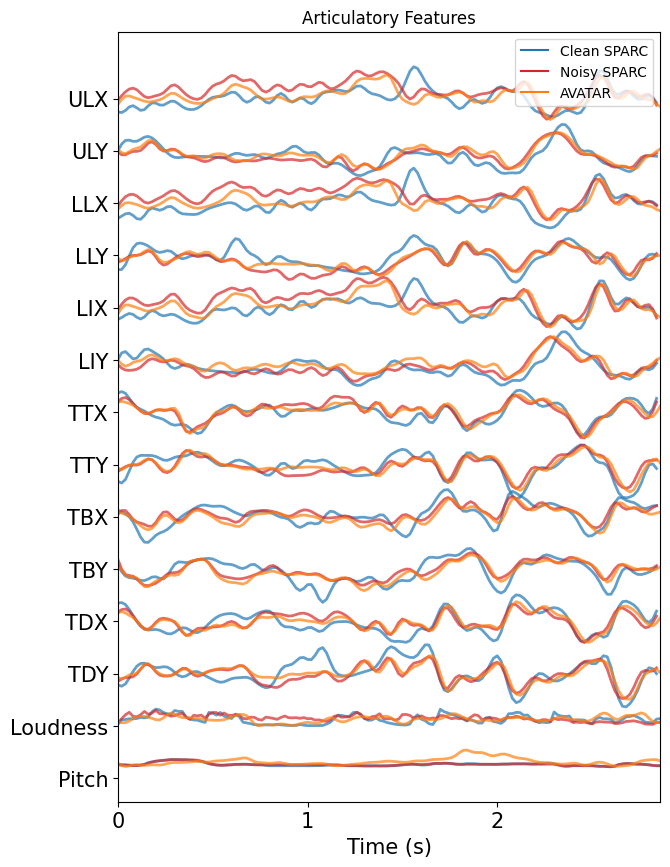

Ground Truth Transcript: and lunasin prevents the bad things from happening
clean_wav, DNSMOS: (speech quality: 3.42, overall:  2.37)
Transcript (WER: 0.125):  And lunacy prevents the bad things from happening.


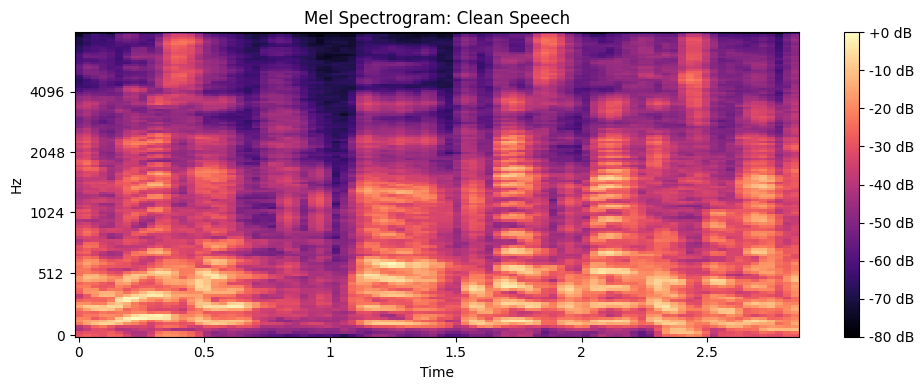

noisy_wav, DNSMOS: (speech quality: 3.24, overall:  1.71)
Transcript (WER: 0.125):  And unison prevents the bad things from happening.


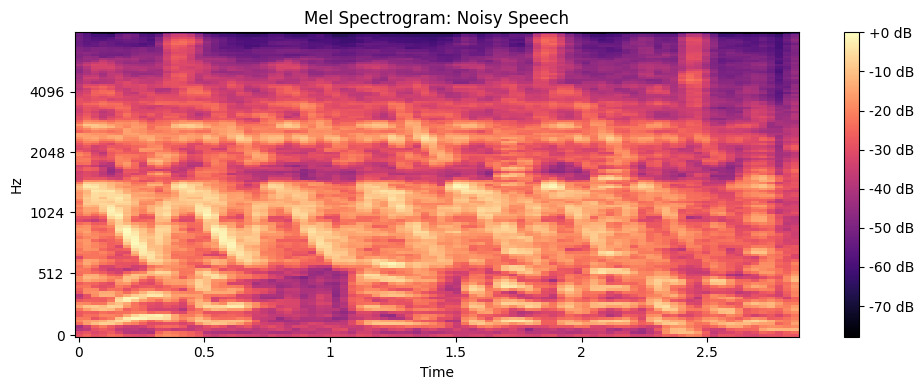

clean_sparc_resynth, DNSMOS: (speech quality: 3.52, overall:  3.00)
Transcript (WER: 0.25):  A lunacy prevents the bad things from happening.


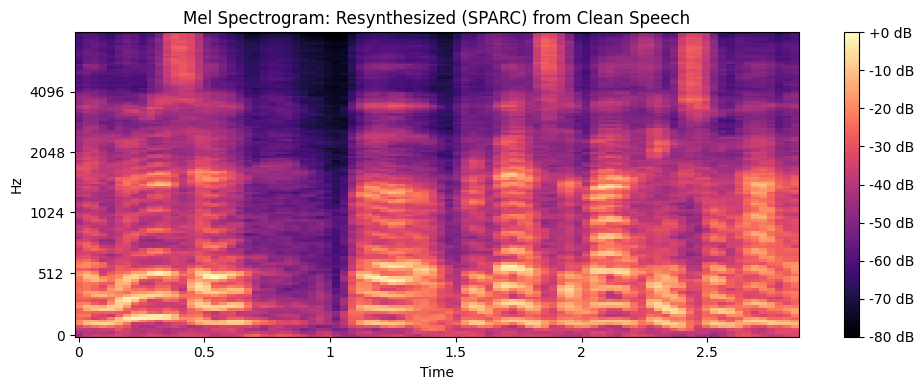

noisy_sparc_resynth, DNSMOS: (speech quality: 2.57, overall:  1.46)
Transcript (WER: 1.25):  And it was, you know, we were actually in the zone,


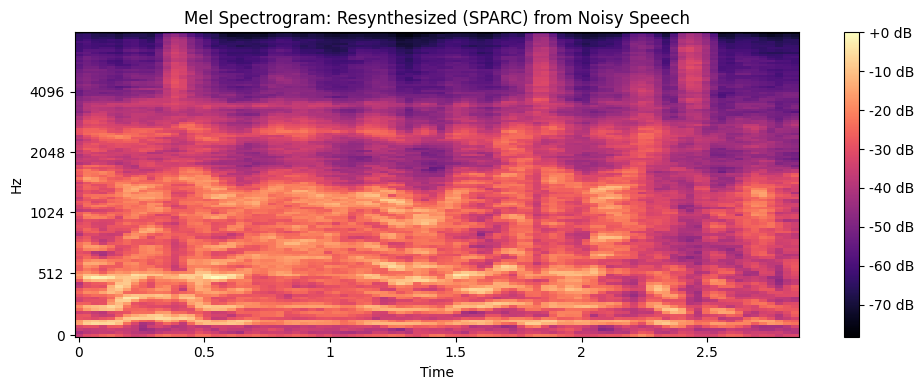

avatar_resynth, DNSMOS: (speech quality: 3.15, overall:  1.89)
Transcript (WER: 0.875):  And we're still not even so long.


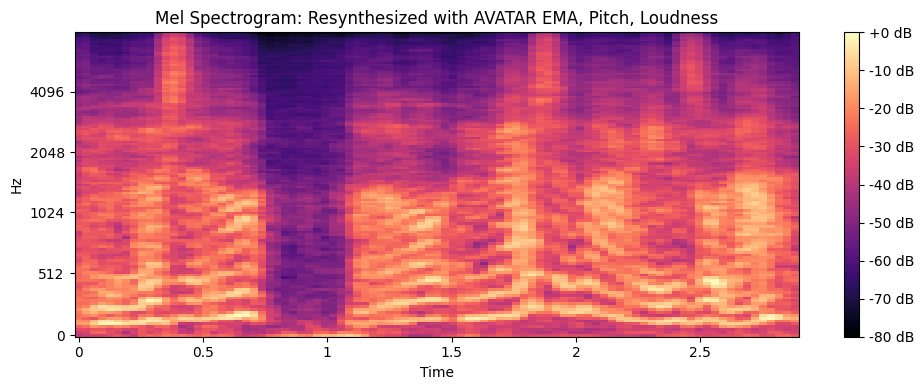

avatar_resynth_noisy_pl, DNSMOS: (speech quality: 3.13, overall:  1.83)
Transcript (WER: 1.0):  And we're also, we're also working in a solar.


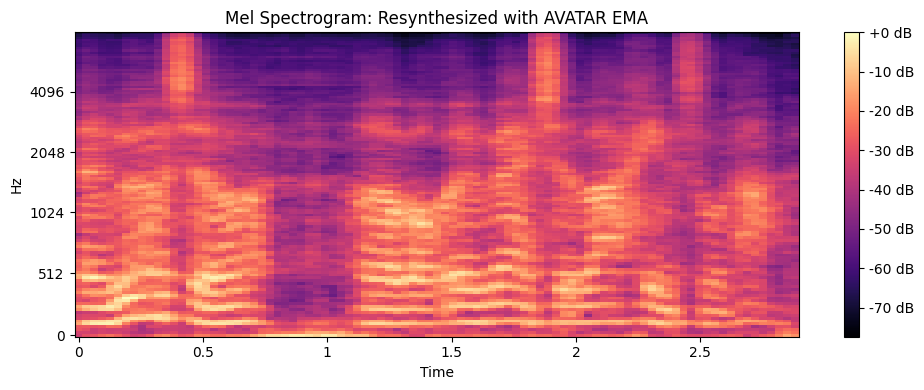

avatar_resynth_clean_pl, DNSMOS: (speech quality: 3.40, overall:  2.14)
Transcript (WER: 0.875):  and also, advanced at backing sold-out


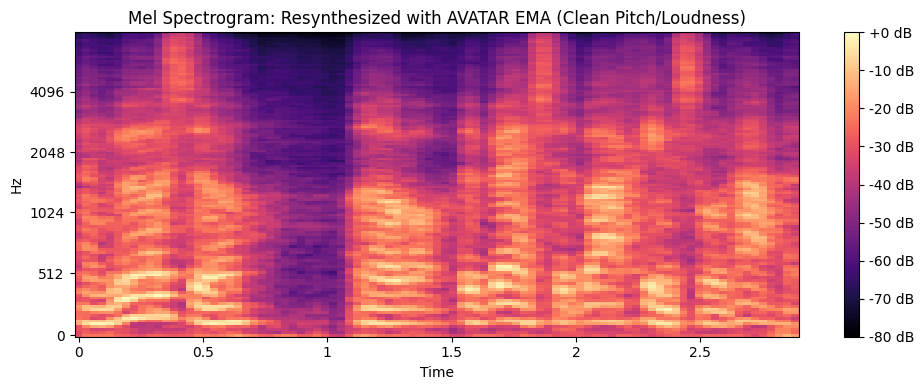

In [16]:
video_file = "/Users/monicatang/Desktop/ee225d/av_dataset/xaa/_OfpuN4YdBs_0.mp4"
noise_file = "/Users/monicatang/Downloads/musan/noise/wavfiles/noise-free-sound-0004.wav"
snr = -5
gt_transcript = "and lunasin prevents the bad things from happening"
inference(video_file, noise_file, snr, gt_transcript, save=True)

MSE Loss (Noisy SPARC): 0.8597913980484009
MSE Loss (AVATAR): 0.6908506155014038
Smooth L1 Loss (Noisy SPARC): 0.35513389110565186
Smooth L1 Loss (AVATAR): 0.29271137714385986


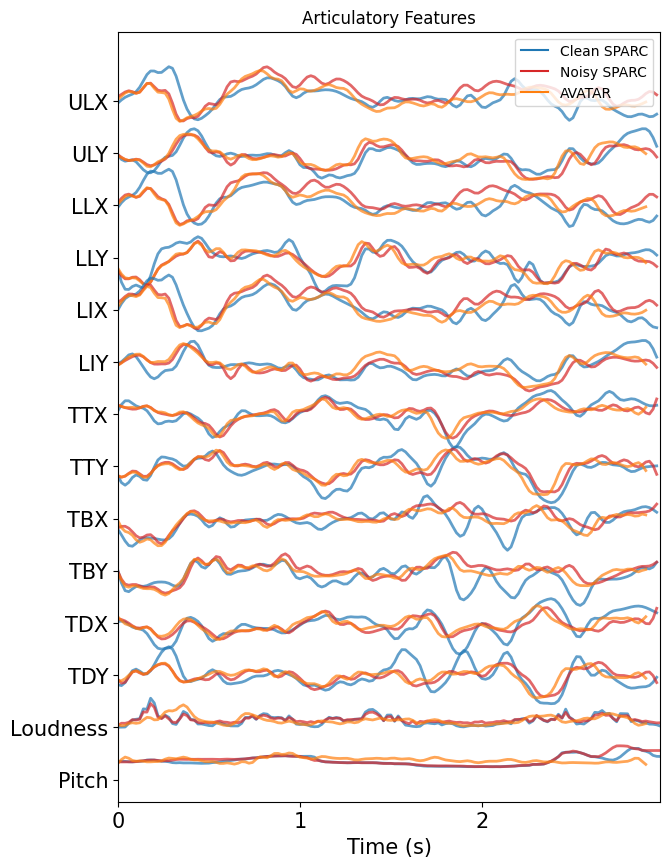

Ground Truth Transcript: or return on investment and what i believe
clean_wav, DNSMOS: (speech quality: 3.00, overall:  1.76)
Transcript (WER: 0.0):  or return on investment. And what I believe


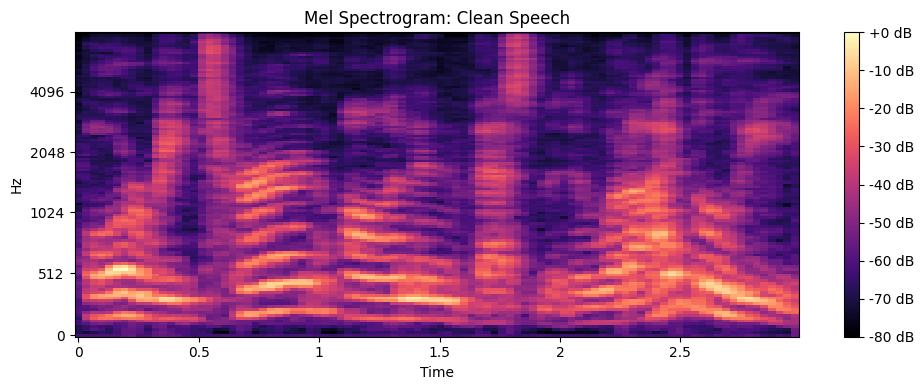

noisy_wav, DNSMOS: (speech quality: 1.15, overall:  1.07)
Transcript (WER: 0.0):  or return on investment. And what I believe


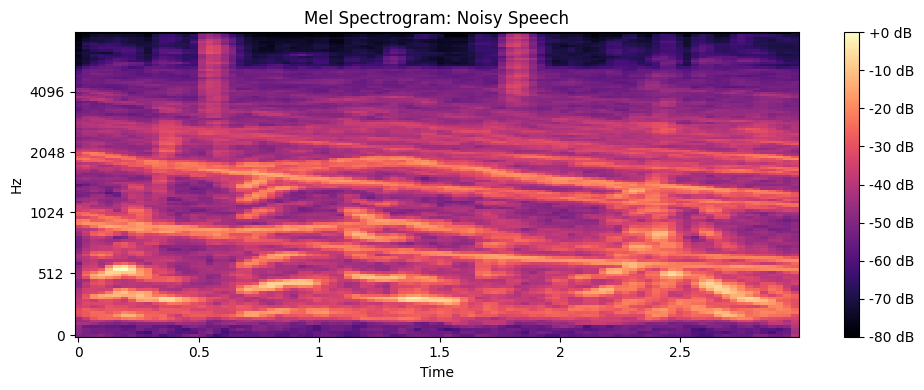

clean_sparc_resynth, DNSMOS: (speech quality: 2.82, overall:  1.72)
Transcript (WER: 0.0):  or return on investment. And what I believe


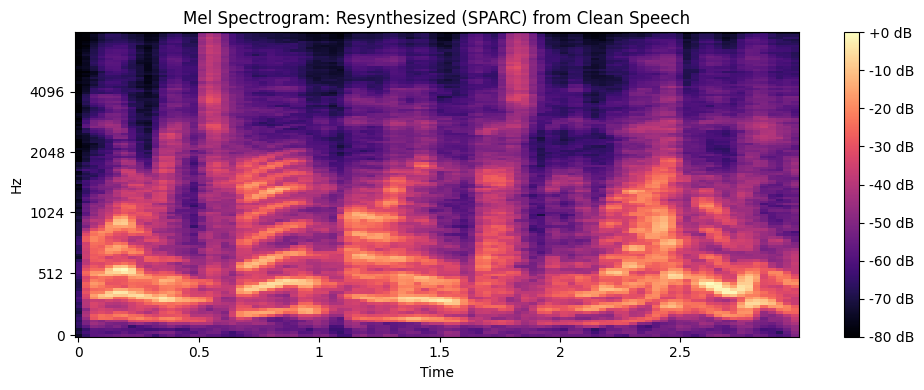

noisy_sparc_resynth, DNSMOS: (speech quality: 1.19, overall:  1.08)
Transcript (WER: 1.125):  I won't beat you sir. I mean, as a...


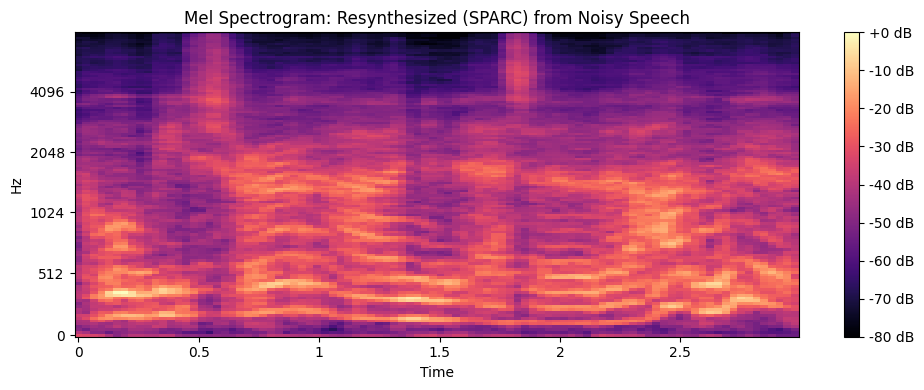

avatar_resynth, DNSMOS: (speech quality: 1.35, overall:  1.12)
Transcript (WER: 1.0):  Oh, yes. I knew that. I knew that.


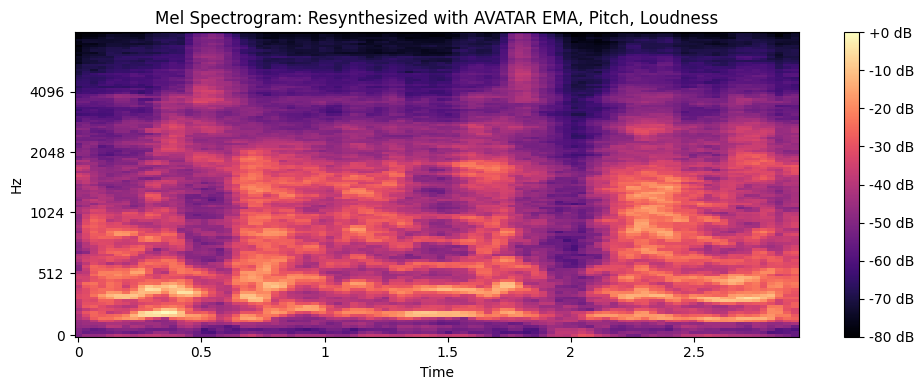

avatar_resynth_noisy_pl, DNSMOS: (speech quality: 1.25, overall:  1.13)
Transcript (WER: 1.25):  I will be sure I'm as loud as I can be.


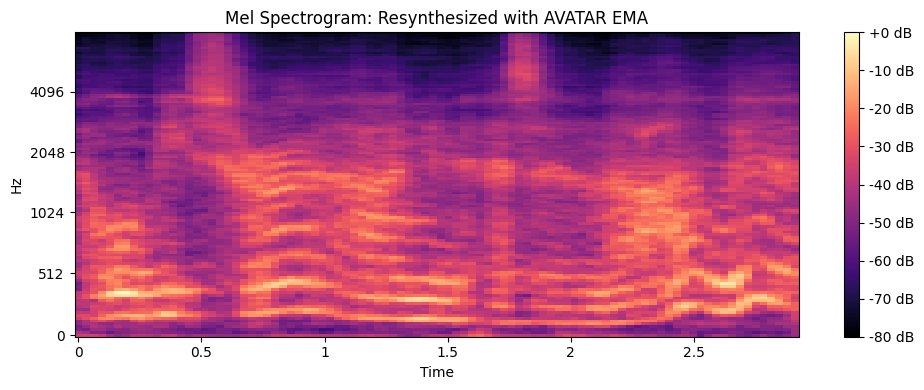

avatar_resynth_clean_pl, DNSMOS: (speech quality: 2.25, overall:  1.39)
Transcript (WER: 1.0):  Oh, me tur. I mean, that's not weird.


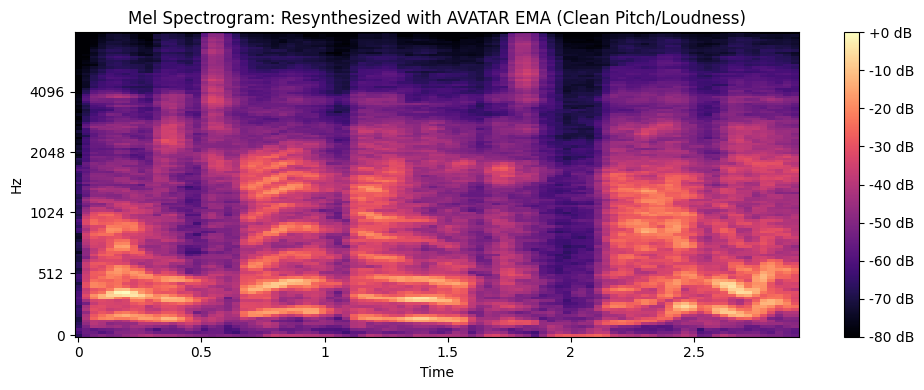

In [17]:
video_file = "/Users/monicatang/Desktop/ee225d/av_dataset/inference_data/gZDqKTqAFVQ_15.mp4"
noise_file = "/Users/monicatang/Downloads/musan/noise/wavfiles/noise-free-sound-0003.wav"
snr = 3
gt_transcript = "or return on investment and what i believe"
inference(video_file, noise_file, snr, gt_transcript, save=True)

MSE Loss (Noisy SPARC): 0.5470296740531921
MSE Loss (AVATAR): 0.4821738004684448
Smooth L1 Loss (Noisy SPARC): 0.23969939351081848
Smooth L1 Loss (AVATAR): 0.21294747292995453


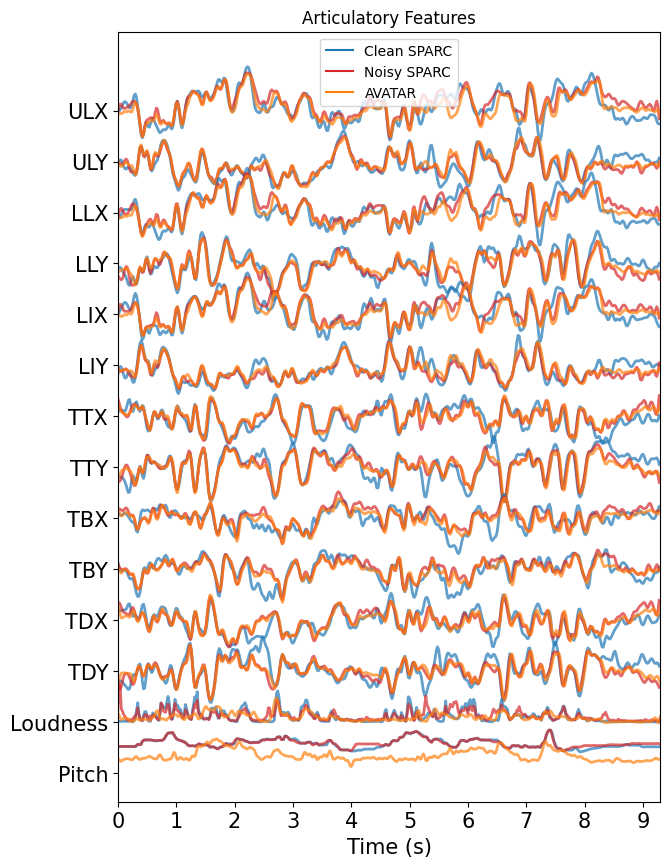

Ground Truth Transcript: OK so these are the rush hours for almost all the cities. OK, so people kind of avoid traveling during the rush hours
clean_wav, DNSMOS: (speech quality: 3.48, overall:  3.05)
Transcript (WER: 0.13043478260869565):  So these are the rush hours for almost all the cities. So people kind of avoid travelling during the rush hours.


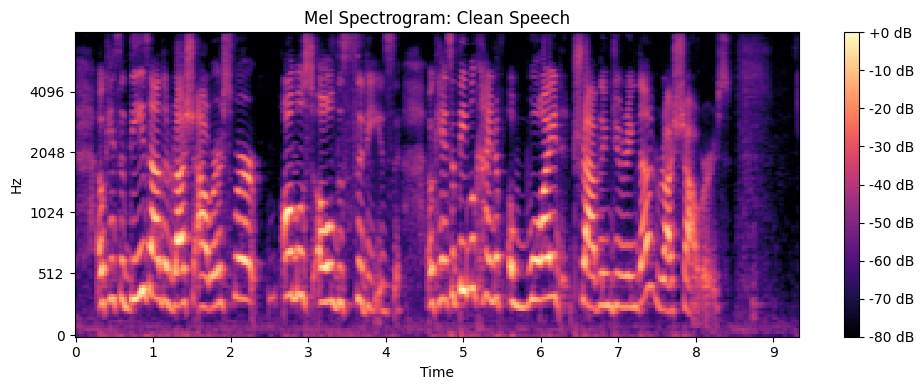

noisy_wav, DNSMOS: (speech quality: 3.25, overall:  2.03)
Transcript (WER: 0.08695652173913043):  Okay, so these are the rush hours for almost all the cities. Okay, so people kind of avoid traveling during the rush hours.


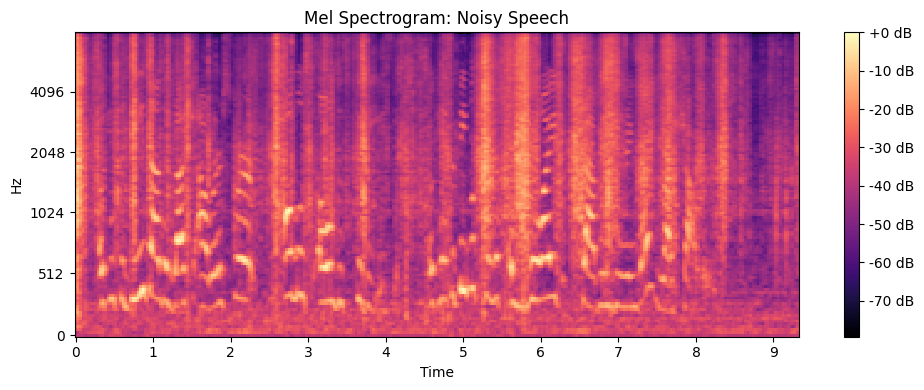

clean_sparc_resynth, DNSMOS: (speech quality: 3.33, overall:  2.98)
Transcript (WER: 0.08695652173913043):  Okay, so these are the rush hours for almost all the cities. Okay, so people kind of avoid traveling during the rush hours.


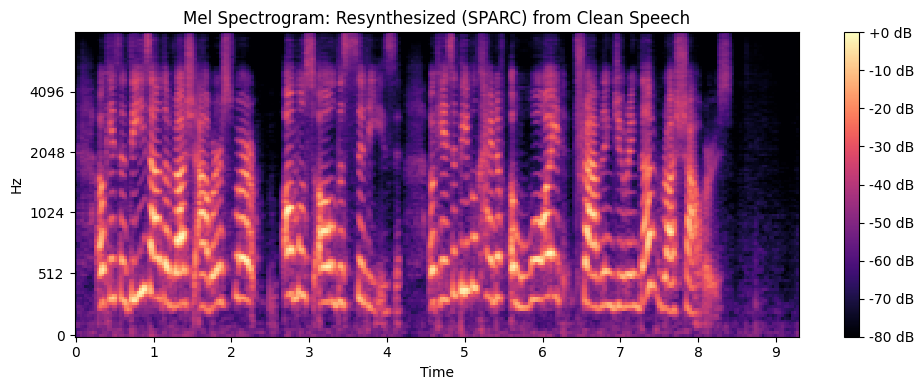

noisy_sparc_resynth, DNSMOS: (speech quality: 3.32, overall:  2.23)
Transcript (WER: 0.4782608695652174):  These are the rush hours for almost all the cities. People are wondering why we are hearing about rush hours.


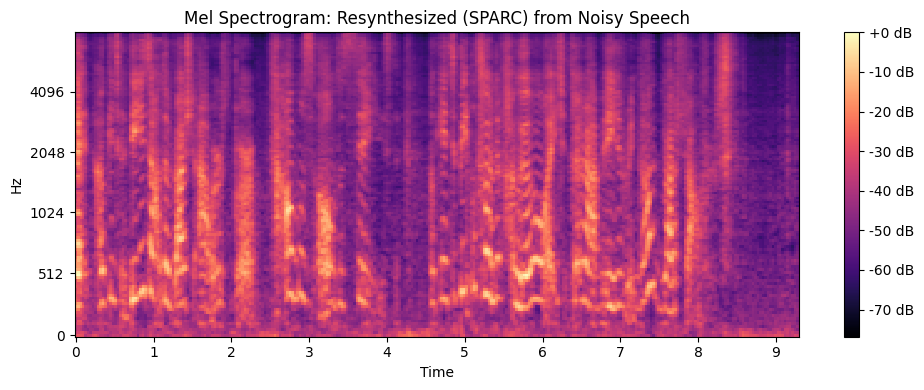

avatar_resynth, DNSMOS: (speech quality: 3.33, overall:  2.36)
Transcript (WER: 1.0869565217391304):  I'll get the knees out of my shower, swerve! I almost honked the knees. I'll get the big weapon around before I eat the crab meat during the rush hour.


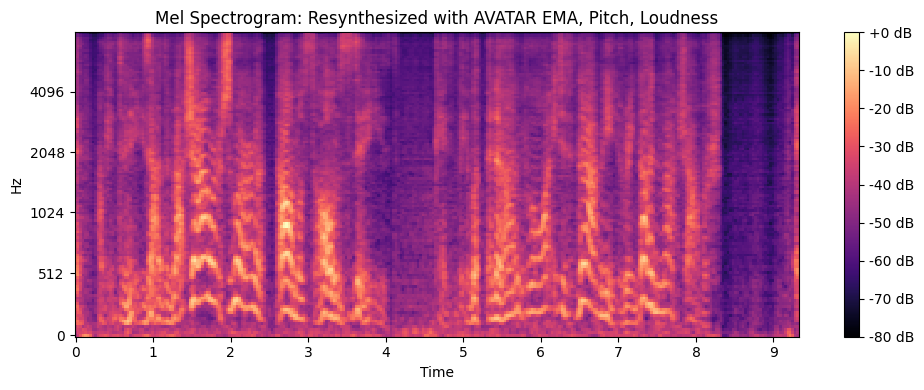

avatar_resynth_noisy_pl, DNSMOS: (speech quality: 3.29, overall:  2.18)
Transcript (WER: 0.43478260869565216):  These are the rush hours for almost all the cities. People can go on and on about the rush hours.


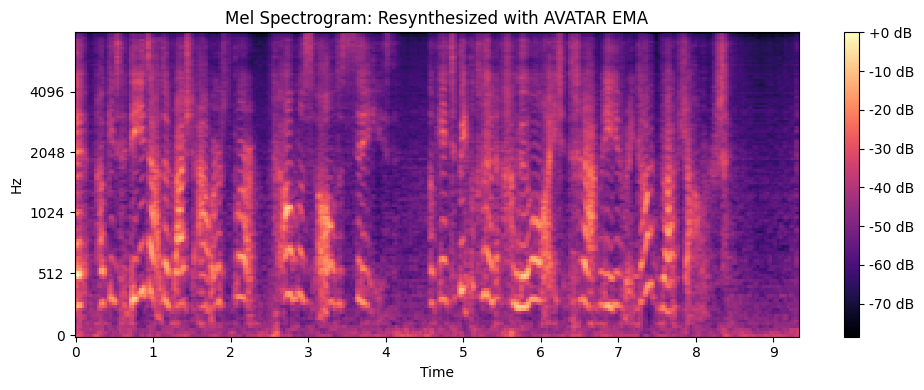

avatar_resynth_clean_pl, DNSMOS: (speech quality: 3.07, overall:  2.35)
Transcript (WER: 0.34782608695652173):  These are the rush hours for almost all the cities. People avoid that during rush hours.


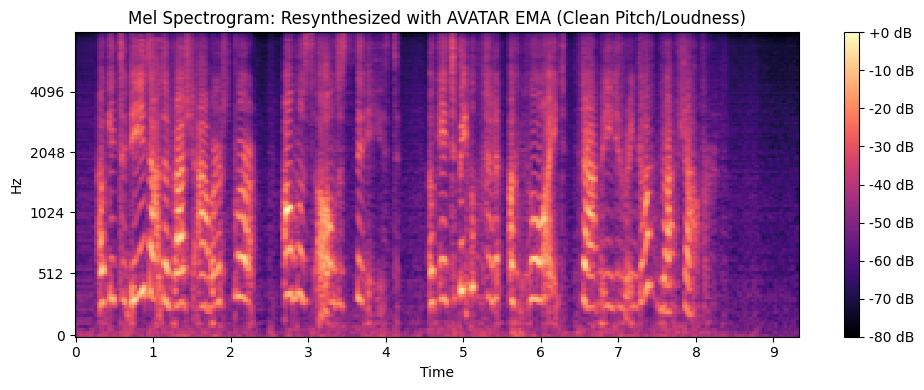

In [18]:
video_file = "/Users/monicatang/Desktop/ee225d/av_dataset/inference_data/Z6orANtnfLE_3.mp4"
noise_file = "/Users/monicatang/Downloads/musan/noise/wavfiles/noise-free-sound-0164.wav"
snr = 0
gt_transcript = "OK so these are the rush hours for almost all the cities. OK, so people kind of avoid traveling during the rush hours"
inference(video_file, noise_file, snr, gt_transcript, save=True)

MSE Loss (Noisy SPARC): 0.6760959029197693
MSE Loss (AVATAR): 0.484425812959671
Smooth L1 Loss (Noisy SPARC): 0.2879496216773987
Smooth L1 Loss (AVATAR): 0.2177208662033081


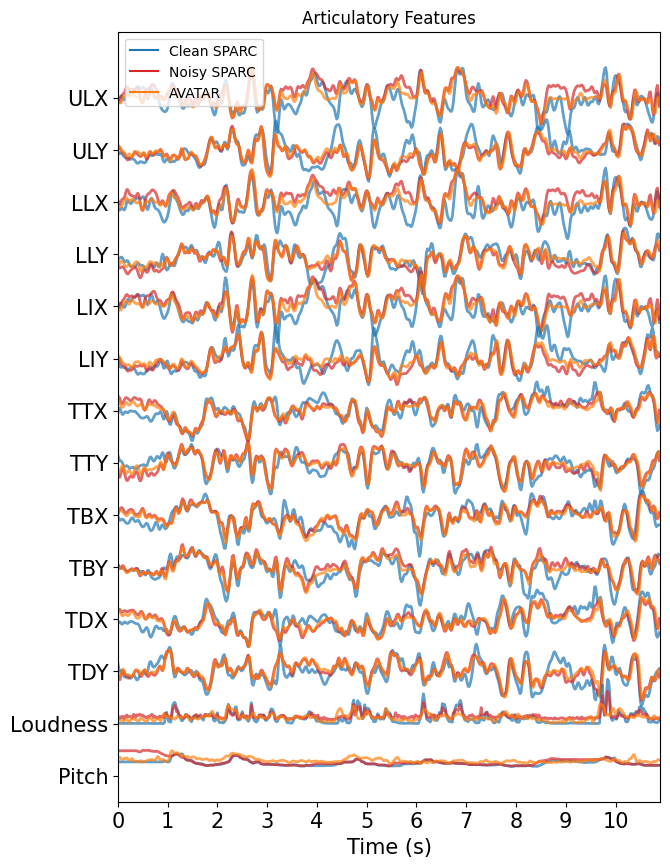

Ground Truth Transcript: the first is to say that when you're constructing an argument in the law, you should always ask yourself what is the authority for this claim that i'm making. every point you make
clean_wav, DNSMOS: (speech quality: 3.70, overall:  3.31)
Transcript (WER: 0.0):  The first is to say that when you're constructing an argument in the law, you should always ask yourself, what is the authority for this claim that I'm making? Every point you make


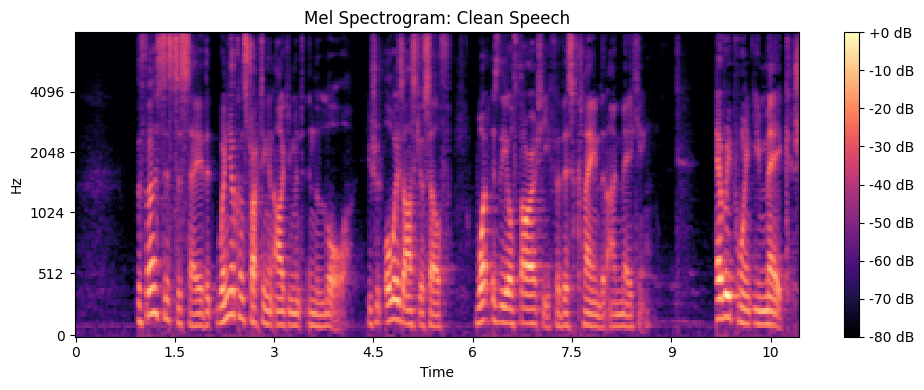

noisy_wav, DNSMOS: (speech quality: 1.24, overall:  1.12)
Transcript (WER: 0.030303030303030304):  The first is to say that when you're constructing an argument in a law, you should always ask yourself, what is the authority for this claim that I'm making? Every point you make


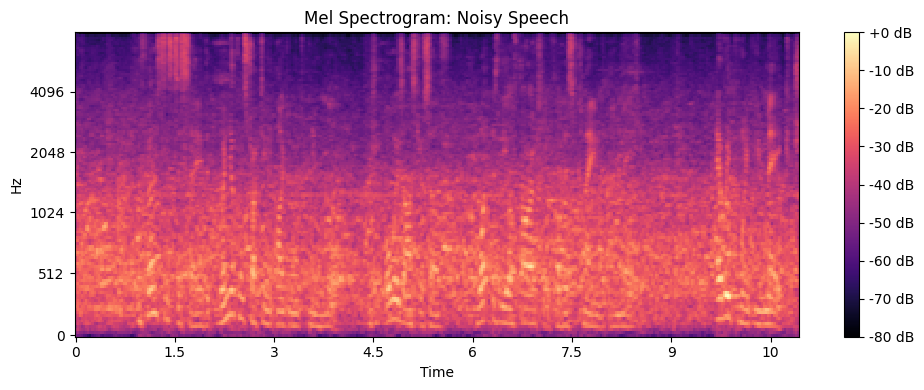

clean_sparc_resynth, DNSMOS: (speech quality: 3.67, overall:  3.41)
Transcript (WER: 0.0):  The first is to say that when you're constructing an argument in the law, you should always ask yourself, what is the authority for this claim that I'm making? Every point you make


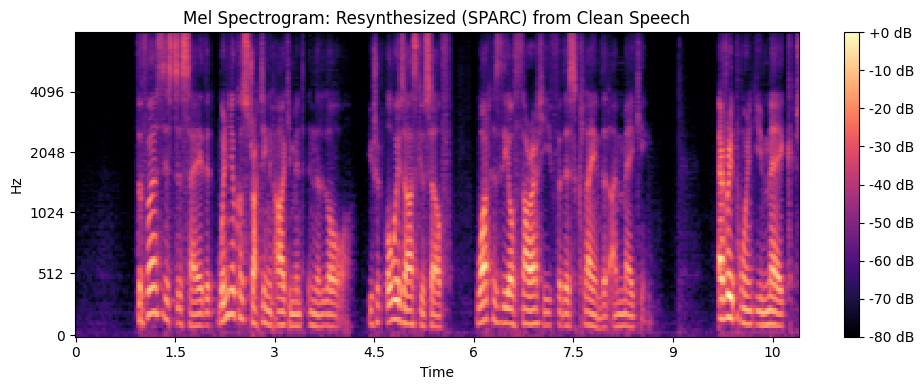

noisy_sparc_resynth, DNSMOS: (speech quality: 3.21, overall:  1.93)
Transcript (WER: 0.30303030303030304):  First is to say that when you're constructing an item, and always ask yourself, what is the authority over this claim that I make? Every point you make...


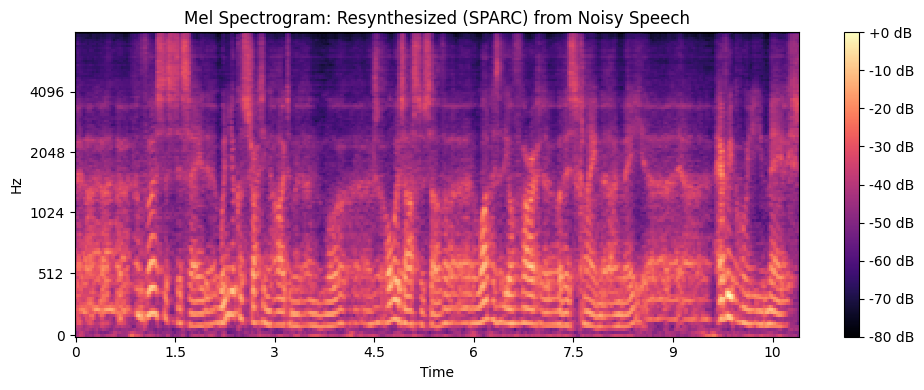

avatar_resynth, DNSMOS: (speech quality: 3.34, overall:  2.16)
Transcript (WER: 0.6060606060606061):  Verses say that when you're constructing an argument in the law, it always has to suffer one of the other, where it's claimed that it may be. Every morning you may...


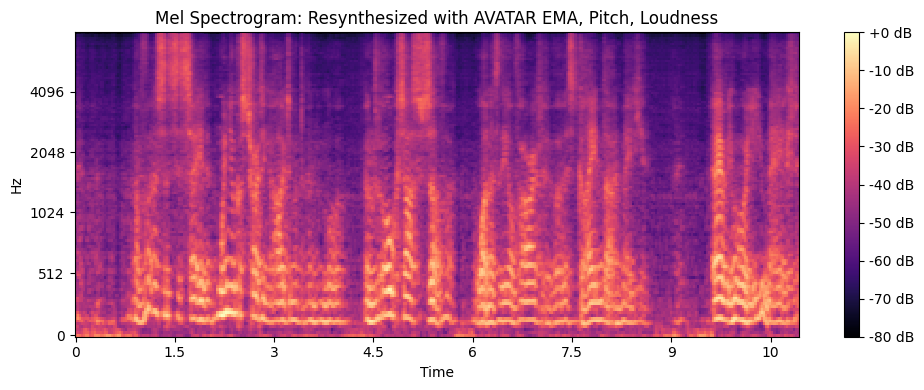

avatar_resynth_noisy_pl, DNSMOS: (speech quality: 3.36, overall:  2.19)
Transcript (WER: 0.42424242424242425):  First is to say that when you're constructing Heidemann and Moore, one always asks yourself, what is the authoritative of this claim that I made? Every point you make is


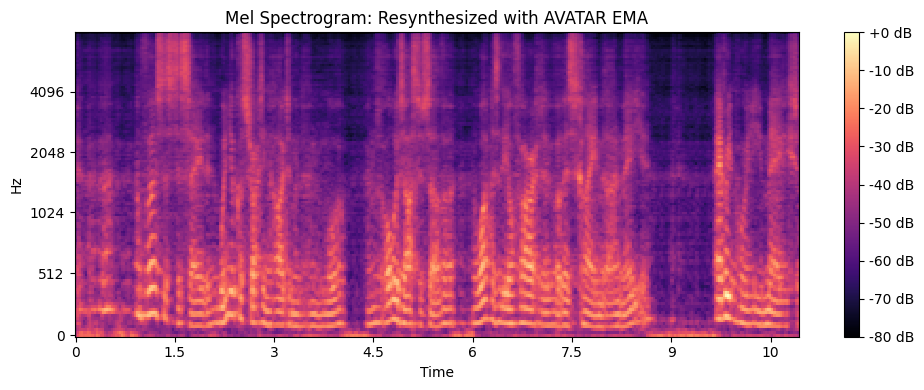

avatar_resynth_clean_pl, DNSMOS: (speech quality: 3.47, overall:  2.90)
Transcript (WER: 0.21212121212121213):  First is to say that when you're constructing a argument in law, always ask yourself, what is the authority for this claim that I make? Every point you make


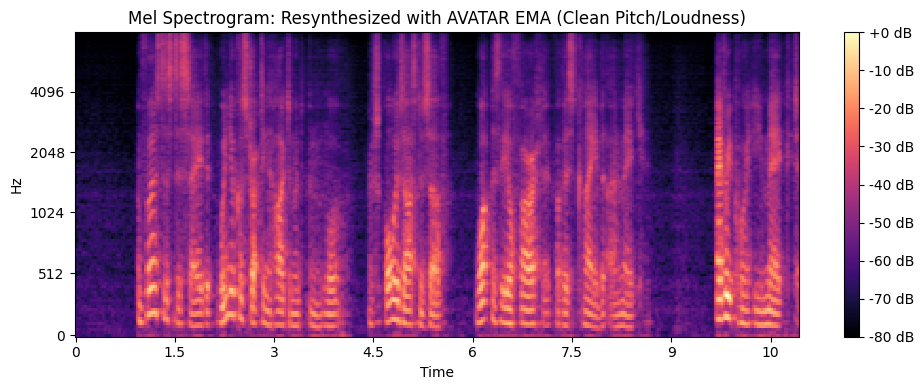

In [19]:
video_file = "/Users/monicatang/Desktop/ee225d/av_dataset/inference_data/zVLaUgT2-Qw_3.mp4"
noise_file = "/Users/monicatang/Downloads/musan/noise/wavfiles/noise-free-sound-0502.wav"
snr = 0
gt_transcript = "the first is to say that when you're constructing an argument in the law, you should always ask yourself what is the authority for this claim that i'm making. every point you make"
inference(video_file, noise_file, snr, gt_transcript, save=True)